<a href="https://colab.research.google.com/github/paruliansaragi/cnn-fastai/blob/master/lesson9_Colab_w_Notes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi Label Classification

In [0]:
!pip install fastai==0.7.*

    100% |████████████████████████████████| 122kB 6.1MB/s 
    100% |████████████████████████████████| 112kB 7.6MB/s 
    100% |████████████████████████████████| 184kB 10.1MB/s 
    100% |████████████████████████████████| 496.4MB 35kB/s 
    100% |████████████████████████████████| 122kB 26.3MB/s 
    100% |████████████████████████████████| 2.2MB 1.5MB/s 
    100% |████████████████████████████████| 1.5MB 9.8MB/s 
    100% |████████████████████████████████| 3.6MB 5.1MB/s 
    100% |████████████████████████████████| 61kB 12.8MB/s 
    100% |████████████████████████████████| 71kB 26.8MB/s 
    100% |████████████████████████████████| 11.6MB 2.9MB/s 
    100% |████████████████████████████████| 92kB 29.4MB/s 
    100% |████████████████████████████████| 112kB 31.4MB/s 
    100% |████████████████████████████████| 61kB 23.7MB/s 
    100% |████████████████████████████████| 901kB 6.6MB/s 
    100% |████████████████████████████████| 81kB 24.7MB/s 
    100% |████████████████████████████████| 4.4MB 5

In [0]:
!pip install torchtext==0.2.3

    100% |████████████████████████████████| 51kB 3.6MB/s 
  Running setup.py bdist_wheel for torchtext ... - done
  Stored in directory: /root/.cache/pip/wheels/42/a6/f4/b267328bde6bb680094a0c173e8e5627ccc99543abded97204
Successfully built torchtext
  Found existing installation: torchtext 0.3.1
    Uninstalling torchtext-0.3.1:
      Successfully uninstalled torchtext-0.3.1


In [0]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [0]:
!wget http://pjreddie.com/media/files/VOCtrainval_06-Nov-2007.tar
!wget http://pjreddie.com/media/files/VOCtest_06-Nov-2007.tar

--2018-10-15 16:39:22--  http://pjreddie.com/media/files/VOCtrainval_06-Nov-2007.tar
Resolving pjreddie.com (pjreddie.com)... 128.208.3.39
Connecting to pjreddie.com (pjreddie.com)|128.208.3.39|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://pjreddie.com/media/files/VOCtrainval_06-Nov-2007.tar [following]
--2018-10-15 16:39:22--  https://pjreddie.com/media/files/VOCtrainval_06-Nov-2007.tar
Connecting to pjreddie.com (pjreddie.com)|128.208.3.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 460032000 (439M) [application/octet-stream]
Saving to: ‘VOCtrainval_06-Nov-2007.tar’

VOCtrainval_06-Nov- 100%[===================>] 438.72M  21.4MB/s    in 19s     

2018-10-15 16:39:41 (23.5 MB/s) - ‘VOCtrainval_06-Nov-2007.tar’ saved [460032000/460032000]

URL transformed to HTTPS due to an HSTS policy
--2018-10-15 16:39:42--  https://pjreddie.com/media/files/VOCtest_06-Nov-2007.tar
Resolving pjreddie.com (pjreddie.com)..

In [0]:
!tar xvf VOCtest_06-Nov-2007.tar
!tar xvf VOCtrainval_06-Nov-2007.tar


In [0]:
!wget https://storage.googleapis.com/coco-dataset/external/PASCAL_VOC.zip
!unzip PASCAL_VOC.zip

--2018-10-15 16:41:23--  https://storage.googleapis.com/coco-dataset/external/PASCAL_VOC.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.28.128, 2607:f8b0:400e:c05::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.28.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1998182 (1.9M) [application/zip]
Saving to: ‘PASCAL_VOC.zip’

PASCAL_VOC.zip      100%[===================>]   1.91M  --.-KB/s    in 0.02s   

2018-10-15 16:41:23 (82.9 MB/s) - ‘PASCAL_VOC.zip’ saved [1998182/1998182]

Archive:  PASCAL_VOC.zip
   creating: PASCAL_VOC/
  inflating: PASCAL_VOC/pascal_test2007.json  
  inflating: PASCAL_VOC/pascal_train2007.json  
  inflating: PASCAL_VOC/pascal_train2012.json  
  inflating: PASCAL_VOC/pascal_val2007.json  
  inflating: PASCAL_VOC/pascal_val2012.json  


In [0]:
!mkdir data

In [0]:
!mv PASCAL_VOC data 

In [0]:
!mv VOCdevkit data/PASCAL_VOC

In [0]:
from fastai.conv_learner import *
from fastai.dataset import *

import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
torch.cuda.set_device(0)

In [0]:
torch.backends.cudnn.benchmark=True

In [0]:
PATH = Path('data/PASCAL_VOC')
trn_j = json.load((PATH / 'pascal_train2007.json').open())
IMAGES,ANNOTATIONS,CATEGORIES = ['images', 'annotations', 'categories']
FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = 'file_name','id','image_id','category_id','bbox'

cats = dict((o[ID], o['name']) for o in trn_j[CATEGORIES])
trn_fns = dict((o[ID], o[FILE_NAME]) for o in trn_j[IMAGES])
trn_ids = [o[ID] for o in trn_j[IMAGES]]

JPEGS = 'VOCdevkit/VOC2007/JPEGImages'
IMG_PATH = PATH/JPEGS

In [0]:
def get_trn_anno():
    trn_anno = collections.defaultdict(lambda:[])
    for o in trn_j[ANNOTATIONS]:
        if not o['ignore']:
            bb = o[BBOX]
            bb = np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1])
            trn_anno[o[IMG_ID]].append((bb,o[CAT_ID]))
    return trn_anno

trn_anno = get_trn_anno()


In [0]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [0]:
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1]+1,a[2]-a[0]+1])

def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    draw_im(im, im_a)

## Multi Class

In [0]:
MC_CSV = PATH/'tmp/mc.csv'


In [0]:
trn_anno[12]


[(array([ 96, 155, 269, 350]), 7)]

In [0]:
mc = [set([cats[p[1]] for p in trn_anno[o]]) for o in trn_ids]
mcs = [' '.join(str(p) for p in o) for o in mc]

In [0]:
!mkdir data/PASCAL_VOC/tmp#df.to_csv creates the file but not the directory

In [0]:
df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'clas': mcs}, columns=['fn','clas'])
df.to_csv(MC_CSV, index=False)
#One of the students pointed out that by using Pandas, we can do things much simpler 
#than using collections.defaultdict and shared this gist. The more 
#you get to know Pandas, the more often you realize it is a good way to solve lots of different problems.
#~~ https://gist.github.com/binga/1bc4ebe5e41f670f5954d2ffa9d6c0ed

In [0]:
f_model=resnet34
sz=224
bs=64

In [0]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(PATH, JPEGS, MC_CSV, tfms=tfms, bs=bs)

In [0]:
learn = ConvLearner.pretrained(f_model, md)
learn.opt_fn = optim.Adam

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.torch/models/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:03<00:00, 26219921.03it/s]


In [0]:
lrf=learn.lr_find(1e-5,100)


epoch      trn_loss   val_loss   <lambda>   
    0      1.456625   12.953423  0.5312    



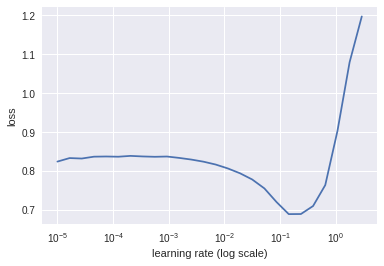

In [0]:
learn.sched.plot(0)

In [0]:
lr = 2e-2

In [0]:
learn.fit(lr, 1, cycle_len=3, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>   
    0      0.329237   0.143703   0.9545    
    1      0.174182   0.080439   0.9732    
    2      0.118041   0.075923   0.9744    



[array([0.07592]), 0.9744000039100646]

In [0]:
lrs = np.array([lr/100, lr/10, lr])

In [0]:
learn.freeze_to(-2)

 84%|████████▍ | 27/32 [00:18<00:01,  2.53it/s, loss=0.423]

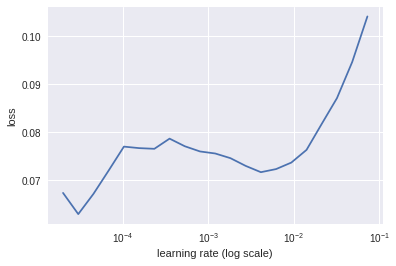

In [0]:
learn.lr_find(lrs/1000)
learn.sched.plot(0)

In [0]:
learn.fit(lrs/10, 1, cycle_len=5, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>   
    0      0.075134   0.078857   0.9738    
    1      0.056974   0.081615   0.9736    
    2      0.040747   0.074413   0.976     
    3      0.028701   0.078939   0.9753    
    4      0.020575   0.077803   0.9754    


[array([0.0778]), 0.9754000000953674]

In [0]:
learn.save('mclas')
learn.load('mclas')

In [0]:
y = learn.predict()
x,_ = next(iter(md.val_dl))
x = to_np(x)

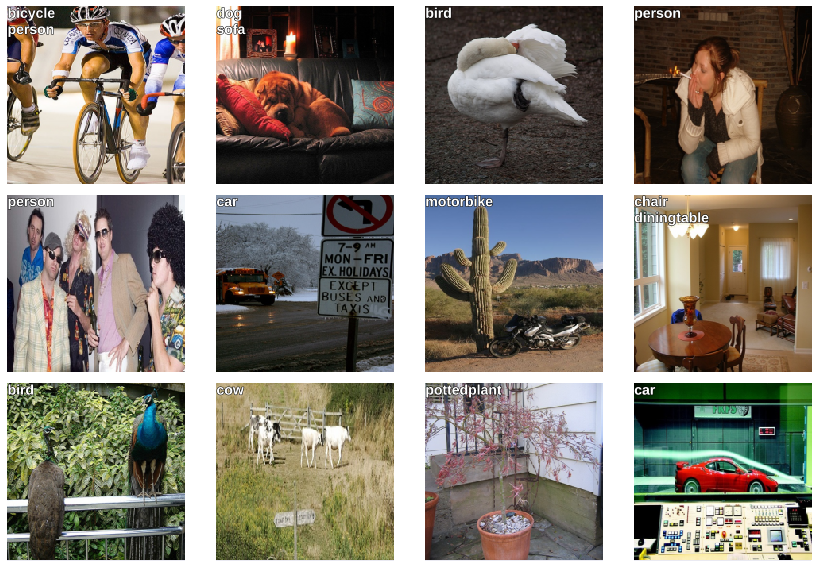

In [0]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    ya = np.nonzero(y[i]>0.4)[0]
    b = '\n'.join(md.classes[o] for o in ya)
    ax = show_img(ima, ax=ax)
    draw_text(ax, (0,0), b)
plt.tight_layout()

In [0]:
#multi class classification is fairly simple, one tweak is the use of set in this 
#line (above) so that the object type so that each object type appears once:
# mc = [set([cats[p[1]] for p in trn_anno[o]]) for o in trn_ids]

In [0]:
#~~ Ignored by lesson~~
#~~ BBOX per cell~~

CLAS_CSV = PATH/'tmp/clas.csv'
MBB_CSV = PATH/'tmp/mbb.csv'

f_model=resnet34
sz=224
bs=64

In [0]:
mc = [[cats[p[1]] for p in trn_anno[o]] for o in trn_ids]
id2cat = list(cats.values())
cat2id = {v:k for k,v in enumerate(id2cat)}
mcs = np.array([np.array([cat2id[p] for p in o]) for o in mc]); mcs

array([array([6]), array([14, 12]), array([ 1,  1, 14, 14, 14]), ..., array([17,  8, 14, 14, 14]),
       array([6]), array([11])], dtype=object)

In [0]:
val_idxs = get_cv_idxs(len(trn_fns))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs, mcs)

In [0]:
mbb = [np.concatenate([p[0] for p in trn_anno[o]]) for o in trn_ids]
mbbs = [' '.join(str(p) for p in o) for o in mbb]

df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'bbox': mbbs}, columns=['fn','bbox'])
df.to_csv(MBB_CSV, index=False)

In [0]:
df.head()


,fn,bbox
0,000012.jpg,96 155 269 350
1,000017.jpg,61 184 198 278 77 89 335 402
2,000023.jpg,229 8 499 244 219 229 499 333 0 1 368 116 1 2 ...
3,000026.jpg,124 89 211 336
4,000032.jpg,77 103 182 374 87 132 122 196 179 194 228 212 ...


In [0]:
aug_tfms = [RandomRotate(3, p=0.5, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(PATH, JPEGS, MBB_CSV, tfms=tfms, bs=bs, continuous=True, num_workers=4)

In [0]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [0]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [0]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i]))

In [0]:
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [0]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [0]:
x,y=to_np(next(iter(md.trn_dl)))
x=md.trn_ds.ds.denorm(x)

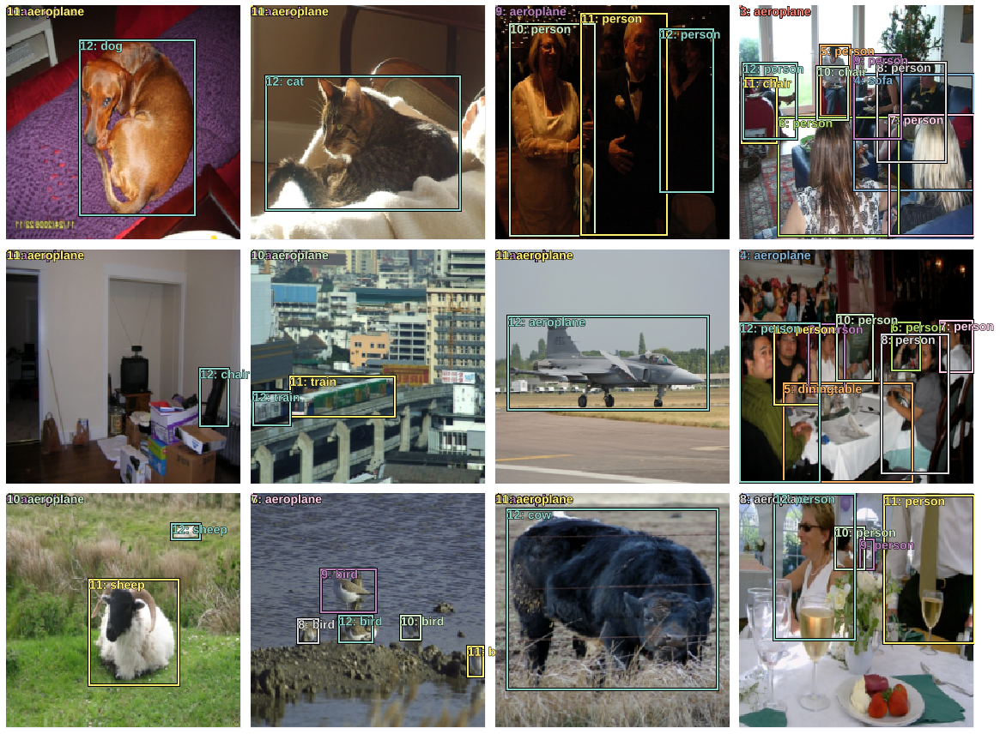

In [0]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i])
plt.tight_layout()

In [0]:
#Set up model
#We're going to make a simple first model that simply predicts what object is 
#located in each cell of a 4x4 grid. Later on we can try to improve this.

anc_grid = 4
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)
anc_y = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()

In [0]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)


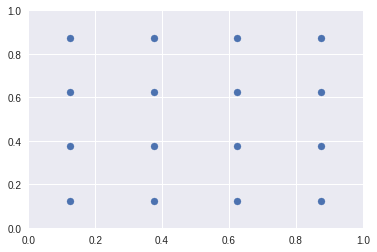

In [0]:
plt.scatter(anc_x, anc_y)
plt.xlim(0, 1)
plt.ylim(0, 1);

In [0]:
anchors

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [0]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)


In [0]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])
anchor_cnr

Variable containing:
 0.0000  0.0000  0.2500  0.2500
 0.0000  0.2500  0.2500  0.5000
 0.0000  0.5000  0.2500  0.7500
 0.0000  0.7500  0.2500  1.0000
 0.2500  0.0000  0.5000  0.2500
 0.2500  0.2500  0.5000  0.5000
 0.2500  0.5000  0.5000  0.7500
 0.2500  0.7500  0.5000  1.0000
 0.5000  0.0000  0.7500  0.2500
 0.5000  0.2500  0.7500  0.5000
 0.5000  0.5000  0.7500  0.7500
 0.5000  0.7500  0.7500  1.0000
 0.7500  0.0000  1.0000  0.2500
 0.7500  0.2500  1.0000  0.5000
 0.7500  0.5000  1.0000  0.7500
 0.7500  0.7500  1.0000  1.0000
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [0]:
n_clas = len(id2cat)+1
n_act = k*(4+n_clas)

## SSD and YOLO

~~ Approach 1 ~~

We have an input image which goes through our convnet and outputs a vector of size 4+c where c is the c=len(cats). This gives us an object detector for the largest object in an image. Now lets create one that finds 16 objects. The obvious way to do this would be to take the last linear layer and rather than having 4+c outputs, we could have 16x(4+c) outputs. This gives us 16 sets of class probabilities and 16 sets of bbox coordinates. Then we would just need a loss function that will check whether those 16 sets of bbox's correctly represented the up to 16 objects in the image.

![alt text](https://cdn-images-1.medium.com/max/1200/1*fPHmCosDHcrHmtKvWFK9Mg.png)

In [0]:
# ~~ Approach 2 ~~
#The second way to do this rather than using nn.linear, what if we instead
#took from our Resnet conv backbone and added a nn.Conv2d with stride=2.
#This will give us a 4x4x[# of filters] tensor - here lets make it a 
# 4x4x(4+c) so that we get a tensor with the number of elements equal to the 
#exact number of elements we wanted. Now if we created a lost function and took
#a 4x4x(4+c) tensor and mapped it to 16 objects in the image and checked whether
#each one was correctly represented by these 4+c activations, this would work well.
#
#Both the above methods are used. The approach where the output is one big long
#vector from a fully connect linear layer is used by a class of models known as
#YOLO. 
#
#Where as the approach using conv activations is called SSD (Single Shot Detector).
#Things are moving to SSD with YOLO3 using SSD.
#


## Anchor Boxes

![alt text](https://cdn-images-1.medium.com/max/1200/1*8kpDP3FZFxW99IUQE0C8Xw.png)

Lets image we had another Conv2d(stride=2) then we would have a 2x2x(4+c) tensor. Creating a grid that looked like this:

![alt text](https://cdn-images-1.medium.com/max/1200/1*uA-oJok4-Rng6mnHOOPyNQ.png)

This is how the geometry of the activiations of the second extra convolutional stride 2 layer are. Remember stride 2 convolution does the same thing to the geometry of activations as a stride 1 convolution followed by max-pooling.

**We want each grid cell to be responsible for finding the largest object in that part of the image.**

## Receptive Field

Why do we want each conv grid cell to find things in the corresponding part of the image? The reason is the receptive field of that convolutional grid cell. The basic idea is that, throughout your conv layers, every piece of of those tensors has a receptive field, which means which part of the input image was responsible for calculating that cell. 

![alt text](https://cdn-images-1.medium.com/max/1500/1*IgL2CMSit3Hh9N2Fq2Zlgg.png)

Take a single activation (in this case maxpool) and lets see where it came from. 

NB: use the excel and go to formulas and trace precedents from the max pool layer.

Tracing all the way back to the input layer it came from this 6x6 portion of the image (as well as filters). What is more, the middle portion has lots of weights coming out of where else cells in the outside only have one weight coming out. So we call this 6 x 6 cells the receptive field of the one activation we picked.

![alt text](https://cdn-images-1.medium.com/max/1200/1*cCBVbJ2WjiPMlqX4nA2bwA.png)

Note that the receptive field is not just saying its this box but also that the center of the box has more dependencies. This is critical in understanding why conv nets work the way they do. 

### Architecture



In [0]:
#The architecture is, we are going to have a resnet backbone followed by one or
#more 2D convolutions (one for now) which is going to give us a 4x4 grid.

class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k):
    bs,nf,gx,gy = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nf//k)  

In [0]:
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [0]:
#SSD Head 

#1. We start with relu and dropout

#2. Then stride 1 convolution. We did this because it doesn't change the geometry
#at all it just adds an extra layer of calculation. It lets us create not just a
#linear layer but we now have a mini neural network in our custom head. StdConv
#is defined above it does convolution, relu, batchnorm, and dropout. Most research 
#code you see won’t define a class like this, instead they write the entire thing 
#again and again. Don’t be like that. Duplicate code leads to errors and poor understanding.

#3. Stride 2 convolution.

#4. At the end of step 3 the output 3 is 4x4 which gets passed to OutConv.
#OutConv has two separate convolutional layers each of which is stide 1 so it is
#not changing the geometry of the input. One of them is of length number of 
#classes (ignore k for now and +1 is for the background i.e. no obj was detected),
#the other's length is 4. Rather than having a single conv layer that outputs 4+c,
#lets have two layers and return their outputs in a list. This allows these layers
#to specialize. When you have multiple tasks, they can share layers but do not
#have to share all the layers. In this case, our two tasks of creating a classifier
#and a bounding box regression share every single layer except the very last one.

#5. At the end we flatten out the convolution because our loss function expects
#a flattened out tensor but we could rewrite it not to do that. 

class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1)
#         self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
#         x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

head_reg4 = SSD_Head(k, -3.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam
k

1

In [0]:
# ~~ Loss Function ~~

#The loss function needs to look at each of these 16 activations, each of which
#has four bounding box coordinates and c+1 class probabilities and decide if 
#those activations are close or far away from the object which is the closest
#to this grid cell in the image. If nothing is there, then whether it is predicting
#the background correctly. That turns out to be very hard to do. 

# ~~ The matching problem ~~

#The loss function needs to take each of the objects in the image and match them
#to one of these convolutional grid cells to say "this grid cell is responsible
#for this particular object" so then it go ahead and say "okay, how class are
#the 4 coordinates and how close are the class probabilities".

Here is our goal

![alt text](https://cdn-images-1.medium.com/max/1200/1*8M9x-WgHNasmuLSJNbKoaQ.png)

In [0]:
#Our dependent variable looks like the one on the left, and our final conv layer
#is going to be 4x4x(c+1) in this case c=20. We then flatten that out into a 
#vector. Our goal is to come up with a function that which takes in a dependent
#variable and also some particular set of activations and returns a higher 
#number if these activations are not good a reflection of the ground truth 
#bounding box or vice versa.

def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

In [0]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [0]:
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb, anchors)
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(f'loc: {lls.data[0]}, clas: {lcs.data[0]}')
    return lls+lcs

In [0]:
x,y = next(iter(md.val_dl))
# x,y = V(x).cpu(),V(y)
x,y = V(x),V(y)

In [0]:
for i,o in enumerate(y): y[i] = o.cuda()
learn.model.cuda()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1), ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d

In [0]:
batch = learn.model(x)


In [0]:
ssd_loss(batch, y, True)


 0.1947
 0.1168
 0.2652
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.2885
 0.0888
[torch.cuda.FloatTensor of size 2 (GPU 0)]


1.00000e-02 *
  9.9027
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.1608
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3237
 0.2153
 0.2558
 0.2013
 0.2526
 0.0485
 0.0879
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3258
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2704
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3985
 0.4538
 0.1897
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.1527
 0.1863
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3426
 0.3249
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.0642
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.2027
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2418
 0.2337
 0.2590
[torch.cuda.FloatTensor of size 3 (GPU 0)]


1.00000e-02 *
  8.4642
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3652
 0.1377
[torch.cuda.FloatTensor of size 2 (GPU 0)]


1.00000e-02 *
  9.5146
  5.739

Variable containing:
 83.6429
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [0]:
learn.crit = ssd_loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

epoch      trn_loss   val_loss   
    0      84.857542  18374.820273


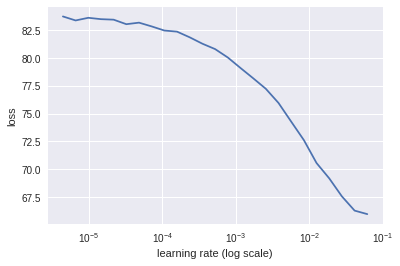

In [0]:

learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [0]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

epoch      trn_loss   val_loss   
    0      42.988079  32.624667 
    1      33.783186  28.712558 
    2      29.432102  27.424876 
    3      26.630858  26.643272 
    4      24.453398  25.915927 


[array([25.91593])]

In [0]:
learn.save('0')
learn.load('0')

In [0]:
# ~~ Testing ~~

x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(x)
b_clas,b_bb = batch
b_clas.size(),b_bb.size()

#make sure these shapes make sense. Now lets look at the ground truth y

(torch.Size([64, 16, 21]), torch.Size([64, 16, 4]))

In [0]:
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox,clas

#Note that the bbox coordinates have to be scaled to between 0 and 1-
#we're treating the image as being 1x1, so they are relative to the size of the
#image.


(Variable containing:
  0.6786  0.4866  0.9911  0.6250
  0.7098  0.0848  0.9911  0.5491
  0.5134  0.8304  0.6696  0.9063
 [torch.cuda.FloatTensor of size 3x4 (GPU 0)], Variable containing:
   8
  10
  17
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [0]:
#We already have show_ground_truth function. This torch_gt (gt: ground truth) 
#function simply converts tensors into numpy array.
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

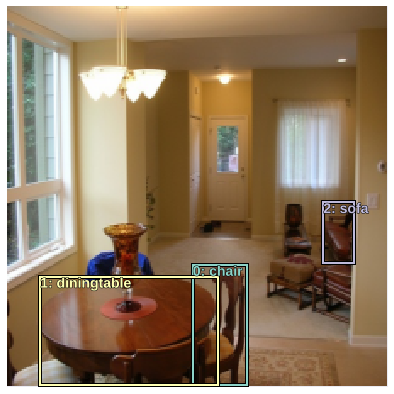

In [0]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, bbox, clas)

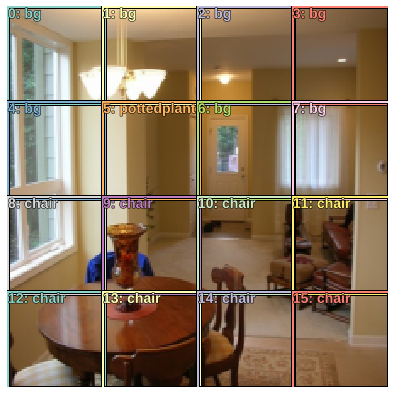

In [0]:
#The above is the ground truth. Here is our 4x4 grid cells from our final conv layer
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])
#each of these square boxes are called diff thing by diff papers: anchor boxes,
#prior boxes and default boxes.

In [0]:
grid_sizes

Variable containing:
 0.2500
[torch.cuda.FloatTensor of size 1x1 (GPU 0)]

In [0]:
#What we're going to do for this loss function (coded above) is to go through a 
#matching problem where we are going to take every one of these 16 boxes and 
#see which one of these ground truth objects has the highest amount of overlap
#with a given square. To measure the amount of overlap we use a standard function
#called the Jaccard Index (IoU).

![alt text](https://cdn-images-1.medium.com/max/1200/1*10ORjq4HuOc0umcnojiDPA.png)

In [0]:
#we are going to go through and find the Jaccard overlap for each one of the 
#three objects versus each of the 16 anchor boxes. That is going to give us a
# 3 x 16 matrix

#Here are the coordinates of all of our anchor boxes (centers, height, width):
anchors

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 0)]

In [0]:
a_ic = actn_to_bb(b_bboxi, anchors)

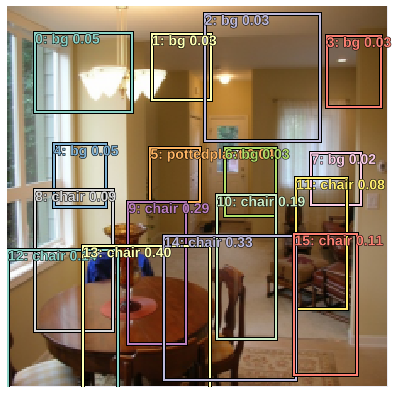

In [0]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [0]:
#Here are the amount of overlap between 3 ground truth objects and 16 anchor boxes:
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps



Columns 0 to 9 
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0091
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0356  0.0549
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000

Columns 10 to 15 
 0.0922  0.0000  0.0000  0.0315  0.3985  0.0000
 0.0103  0.0000  0.2598  0.4538  0.0653  0.0000
 0.0000  0.1897  0.0000  0.0000  0.0000  0.0000
[torch.cuda.FloatTensor of size 3x16 (GPU 0)]

In [0]:
#what we could do now is take the max of dimension 1(row-wise) which will tell
#us the for each ground truth object, what the maximum amount that overlaps
#with some grid cell as well as the index
overlaps.max(1)

(
  0.3985
  0.4538
  0.1897
 [torch.cuda.FloatTensor of size 3 (GPU 0)], 
  14
  13
  11
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [0]:
#We will also going to look at max over a dimension 0 
#(column-wise) which will tell us what is the maximum amount of overlap 
#for each grid cell across all of the ground truth objects
overlaps.max(0)

(
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0356
  0.0549
  0.0922
  0.1897
  0.2598
  0.4538
  0.3985
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  0
  0
  0
  0
  0
  0
  1
  1
  0
  2
  1
  1
  0
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

In [0]:
#what is interesting here is that it tells for every grid cell what is the index of
#the ground truth object which overlaps with it most. Zero is a bit confusing, it
#could either mean the amount of overlap was zero or its largest overlap is with object index zero.

#There is a function called map_to_ground_truth which we will not worry about for now.
#It is super simple code but it is slightly awkward to think about.
#Basically what it does is it combines these two sets of overlaps in a way 
#described in the SSD paper to assign every anchor box to a ground truth object.
#The way it assigns that is each of the three(row-wise max) gets assigned as is.
#For the rest of the anchor boxes, they get assigned to anything which they have 
#an overlap of at least 0.5 with (column-wise). 
#If neither applies, it is considered to be a cell which contains background.
gt_overlap,gt_idx = map_to_ground_truth(overlaps)
gt_overlap,gt_idx

(
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0356
  0.0549
  0.0922
  1.9900
  0.2598
  1.9900
  1.9900
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 0)], 
  0
  0
  0
  0
  0
  0
  0
  0
  1
  1
  0
  2
  1
  1
  0
  0
 [torch.cuda.LongTensor of size 16 (GPU 0)])

In [0]:
#Now you can see a list of all the assignments 
#Anywhere that has gt_overlap < 0.5 gets assigned background.
#The three row-wise max anchor box has high number to force the assignments. 
#Now we can combine these values to classes:
gt_clas = clas[gt_idx]; gt_clas

Variable containing:
  8
  8
  8
  8
  8
  8
  8
  8
 10
 10
  8
 17
 10
 10
  8
  8
[torch.cuda.LongTensor of size 16 (GPU 0)]

In [0]:
#Then add a threshold and finally come up with the three classes that are being predicted:

thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx


 11
 13
 14
[torch.cuda.LongTensor of size 3 (GPU 0)]

In [0]:
#And here are what each of these anchor boxes is meant to be predicting:
gt_clas[1-pos] = len(id2cat)
[id2cat[o] if o<len(id2cat) else 'bg' for o in gt_clas.data]

['bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'sofa',
 'bg',
 'diningtable',
 'chair',
 'bg']

In [0]:
#So that was the matching stage. For L1 loss we can:

#1. take the activations which matched pos_idx = [11, 13, 14]

#2. subtract from those the ground truth bounding boxes.

#3. take the absolute value of the difference.

#4. take the mean of that.

#For classifications , we can just do crossentropy

gt_bbox = bbox[gt_idx]
loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
clas_loss  = F.cross_entropy(b_clasi, gt_clas)
loc_loss,clas_loss

(Variable containing:
 1.00000e-02 *
   6.4784
 [torch.cuda.FloatTensor of size 1 (GPU 0)], Variable containing:
  1.1026
 [torch.cuda.FloatTensor of size 1 (GPU 0)])

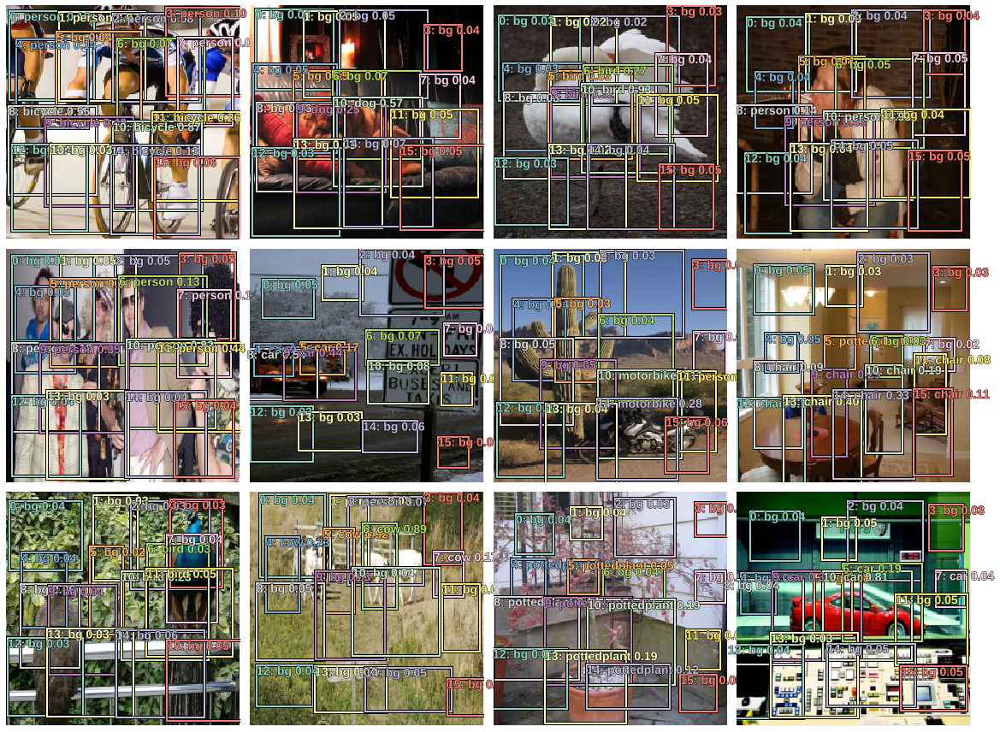

In [0]:
#we will end up with 16 predicted bounding boxes, most of them will be background.
#If you are wondering what it predicts in terms of bounding box of background, 
#the answer is it totally ignores it.

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

In [0]:
#Tweak 1. How do we interpret the activations?
#The way we interpret the activation is defined here:
"""
def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)
"""
#We grab the activations and stick them through tanh (tanh is sigmoid but forces
# it to be in the range of 1 and -1). 
#We then grab the actual position of the anchor boxes, and we will move them 
#around according to the value of activations divided by 2 (actn_bbs[:,:2]/2).
#In other words, each predicted bounding box can be moved by up to 50% of a grid
#size from where its default position is.
#Ditto for its height and width — it can be up to twice as big or half as big as its default size.


In [0]:
#Tweak 2. We actually use binary cross entropy loss instead of cross entropy

"""
class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, 
                            size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None
"""

#Binary cross entropy is what we normally use for multilabel classification.
#In this case, each anchor box can only have one object associated with it.
#it is possible for an anchor box to have nothing associated with it. There are 
#two ways to handle this idea of “background”; one would be to say background is 
#just a class, so let’s use softmax and just treat background as one of the 
#classes that the softmax could predict.
#Alot of people do this but it is hard for NN's to do this. 
#it is basically asking whether this grid cell does not have any of the 20 
#objects that I am interested with Jaccard overlap of more than 0.5.

#On the other hand, what if we just asked for each class; “is it a motorbike?” 
#“is it a bus?”, “ is it a person?” etc and if all the answer is no, 
#consider that background. That is the way we do it here. It is not that we can 
#have multiple true labels, but we can have zero.

#In forward  (see function above code):

#1. First we take the one hot embedding of the target (at this stage, we do have the idea of background)

#2. Then we remove the background column (the last one) which results in a vector
#of all zeros or one one.
#3. Use binary cross-entropy predictions

#So now we have:

#A custom loss function
#A way to calculate Jaccard index
#A way to convert activations to bounding box
#A way to map anchor boxes to ground truth

#Now all it’s left is SSD loss function.

In [0]:
#SSD Loss Functions
"""
def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb, anchors)
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(f'loc: {lls.data[0]}, clas: {lcs.data[0]}')
    return lls+lcs
"""

#The ssd_loss function which is what we set as the criteria, it loops through 
#each image in the mini-batch and call ssd_1_loss function (i.e. SSD loss for one image).

In [0]:
#ssd_1_loss is where it is all happening. It begins by de-structuring bbox 
#and clas. Let’s take a closer look at get_y

"""
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]
"""
#ll these functions (get_y, actn_to_bb, map_to_ground_truth) is working on, 
#not exactly a mini-batch at a time, but a whole bunch of ground truth objects at a time. 
#The data loader is being fed a mini-batch at a time to do the convolutional layers. 
#Because we can have different numbers of ground truth objects in each image 
#but a tensor has to be the strict rectangular shape, fastai automatically 
#pads it with zeros (any target values that are shorter)
#This was something that was added recently and super handy, but that does mean 
#that you then have to make sure that you get rid of those zeros. So get_y gets 
#rid of any of the bounding boxes that are just padding.

#1. Get rid of the padding

#2. Turn the activations to bounding boxes

#3. Do the Jaccard

#4. Do map_to_ground_truth

#5. Check that there is an overlap greater than something around 0.4~0.5 

#6. Find the indices of things thats matched

#7. Assign background class for the ones that did not match

#8. Then finally get L1 loss for the localization, binary cross-entropy loss for
#the classification, and return them which gets added in ssd_loss

## Training

(See code above)

## Result

![alt text](https://cdn-images-1.medium.com/max/1200/1*8azTUd1Ujf3FQSMBwIXgAw.png)

In [0]:
#We want to remove the background and also add some threshold for probabilities.


## More Anchors!

There are 3 ways to do this:

1. Create anchor boxes of different sizes (zoom):

2. Create anchor boxes of different aspect ratios:

3. Use more convolutional layers as sources of anchor boxes (the boxes are randomly jittered so that we can see ones that are overlapping

Combining these approaches, you can create lots of anchor boxes (Jeremy said he wouldn’t print it, but here it is):

In [0]:
anc_grids = [4,2,1]
# anc_grids = [2]
anc_zooms = [0.7, 1., 1.3]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]
# anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]
k

9

In [0]:
anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [0]:
#anchors : middle and height, width

#anchor_cnr : top left and bottom right corners

In [0]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [0]:
#Review of key concept

![alt text](https://cdn-images-1.medium.com/max/1200/1*C67J9RhTAiz9MCD-ebpp_w.png)

In [0]:
#We have a vector of ground truth (sets of 4 bounding box coordinates and a class)

#We have a neural net that takes some input and spits out some output activations

#Compare the activations and the ground truth, calculate a loss, 
#find the derivative of that, and adjust weights according to the derivative 
#times a learning rate.

#We need a loss function that can take ground truth and activation and spit 
#out a number that says how good these activations are.
#To do this, we need to take each one of m ground truth objects and decide 
#which set of (4+c) activations is responsible for that object-which one we 
#should be comparing to decide whether the class is correct and bounding box 
#is close or not (matching problem).

#Since we are using SSD approach, so it is not arbitrary which ones we match up.
#We want to match up the set of activations whose receptive field has the 
#maximum density from where the real object is.

#The loss function needs to be some consistent task. If in the first image, the 
#top left object corresponds with the first 4+c activations, and in the 
#second image, we threw things around and suddenly it’s now going with the last 
#4+c activations, the neural net doesn’t know what to learn.

#Once matching problem is resolved, the rest is just the same as the single object detection.

#Architectures:

#YOLO — the last layer is fully connected (no concept of geometry)
#SSD — the last layer is convolutional

"""
k (zooms x ratios)

For every grid cell which can be different sizes, we can have different 
orientations and zooms representing different anchor boxes which are 
just like conceptual ideas that every one of anchor boxes is associated 
with one set of 4+c activations in our model. 
So however many anchor boxes we have, we need to have that times (4+c) activations. 
That does not mean that each convolutional layer needs that many activations. 
Because 4x4 convolutional layer already has 16 sets of activations, the 2x2 
layer has 4 sets of activations, and finally 1x1 has one set. So we basically 
get 1 + 4 + 16 for free. So we only needs to know k where k is the number of 
zooms by the number of aspect ratios. Where else, the grids, we will get for 
free through our architecture.

"""
#aspect ratio: the ratio of the width to the height of an image or screen.

We then talked about increasing k [5:49] which is the number of anchor boxes for each convolutional grid cell which we can do with different zooms, aspect ratios, and that gives us a plethora of activations and therefore predicted bounding boxes.

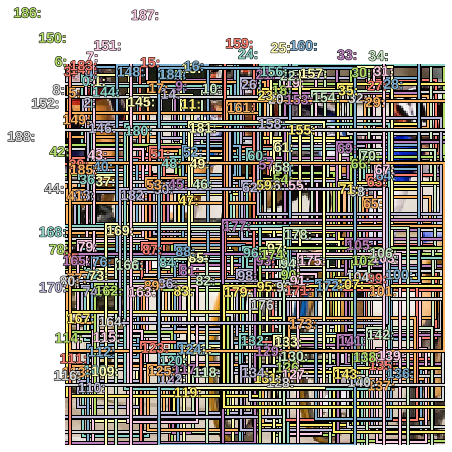

In [0]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)

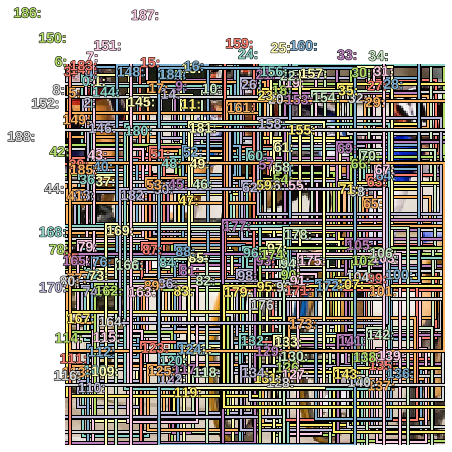

In [0]:
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)


## Model Architecture

![alt text](https://cdn-images-1.medium.com/max/1200/1*BbxbH3gWu8RHMTuXZlDasA.png)



In [0]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv0 = StdConv(512,256, stride=1, drop=drop)
        self.sconv1 = StdConv(256,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

#The model is nearly identical to what we had before. But we have a number of 
#stride 2 convolutions which is going to take us through to 4x4, 2x2, and 1x1 
#(each stride 2 convolution halves our grid size in both directions).

#After we do our first convolution to get to 4x4, we will grab a set of 
#outputs from that because we want to save away the 4x4 anchors.

#Once we get to 2x2, we grab another set of now 2x2 anchors

#Then finally we get to 1x1

#We then concatenate them all together, which gives us the correct number of 
#activations (one activation for every anchor box).

In [0]:
learn.crit = ssd_loss
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [0]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(V(x))

In [0]:
batch[0].size(),batch[1].size()


(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]))

In [0]:
ssd_loss(batch, y, True)


epoch      trn_loss   val_loss   
    0      327.104856 8170277.824


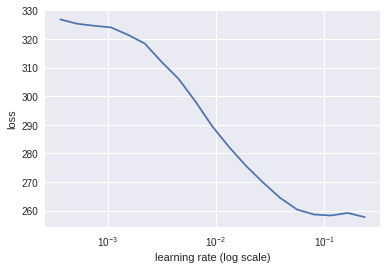

In [0]:

learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=2)

In [0]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))


epoch      trn_loss   val_loss   
    0      158.764841 134.571308
    1      125.932444 102.991286
    2      108.427532 91.370293 
    3      96.351014  87.249017 


[array([87.24902])]

In [0]:
learn.save('tmp')
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss   
    0      90.545484  101.523413
    1      85.745943  85.001027 
    2      77.703246  79.632521 
    3      70.558958  75.460276 


[array([75.46028])]

In [0]:
learn.save('prefocal')


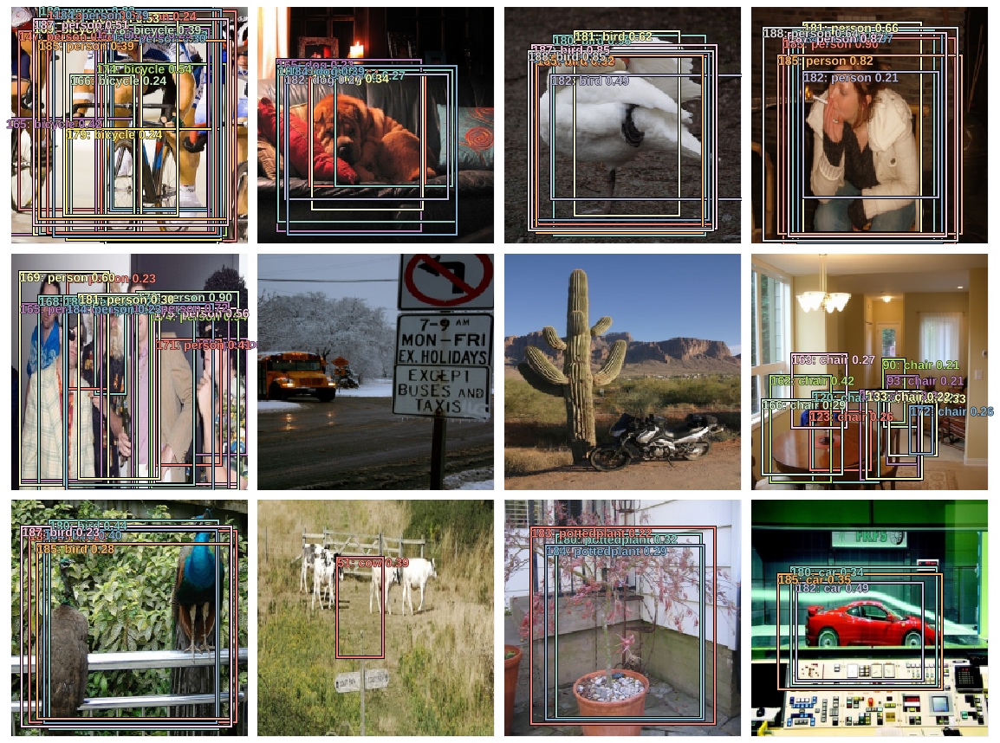

In [0]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.21)
plt.tight_layout()

#Here, we printed out those detections with at least probability of 0.2 . 
#Some of them look pretty hopeful but others not so much.

### History of Object Detection

![alt text](https://cdn-images-1.medium.com/max/1200/1*bQPvoI0soxtlBt1cEZlzcQ.png)

Scalable Object Detection using Deep Neural Networks
https://arxiv.org/abs/1312.2249

When people refer to the multi-box method, they are talking about this paper.
This was the paper that came up with the idea that we can have a loss function that has this matching process and then you can use that to do object detection. So everything since that time has been trying to figure out how to make this better.


Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks
https://arxiv.org/abs/1506.01497

In parallel, Ross Girshick was going down a totally different direction. He had these two-stage process where the first stage used the classical computer vision approaches to find edges and changes of gradients to guess which parts of the image may represent distinct objects. Then fit each of those into a convolutional neural network which was basically designed to figure out if that is the kind of object we are interested in.
R-CNN and Fast R-CNN are hybrid of traditional computer vision and deep learning.
What Ross and his team then did was they took the multibox idea and replaced the traditional non-deep learning computer vision part of their two stage process with the conv net. So now they have two conv nets: one for region proposals (all of the things that might be objects) and the second part was the same as his earlier work.

You Only Look Once: Unified, Real-Time Object Detection
https://arxiv.org/abs/1506.02640

SSD: Single Shot MultiBox Detector
https://arxiv.org/abs/1512.02325

At similar time these paper came out. Both of these did something pretty cool which is they achieved similar performance as the Faster R-CNN but with 1 stage.
They took the multibox idea and they tried to figure out how to deal with messy outputs. The basic ideas were to use, for example, hard negative mining where they would go through and find all of the matches that did not look that good and throw them away, use very tricky and complex data augmentation methods, and all kind of hackery. But they got them to work pretty well.

Focal Loss for Dense Object Detection (RetinaNet)
https://arxiv.org/abs/1708.02002

Then something really cool happened late last year which is this thing called focal loss.
They actually realized why this messy thing wasn’t working. When we look at an image, there are 3 different granularities of convolutional grid (4x4, 2x2, 1x1) [1:37:28]. The 1x1 is quite likely to have a reasonable overlap with some object because most photos have some kind of main subject. On the other hand, in the 4x4 grid cells, the most of 16 anchor boxes are not going to have a much of an overlap with anything. So if somebody was to say to you “$20 bet, what do you reckon this little clip is?” and you are not sure, you will say “background” because most of the time, it is the background.

## Focal Loss

![alt text](https://cdn-images-1.medium.com/max/1200/1*6Bood7G6dUuhigy9cxkZ-Q.png)

The key thing is this very first picture. The blue line is the binary cross entropy loss. If the answer is not a motorbike [1:41:46], and I said “I think it’s not a motorbike and I am 60% sure” with the blue line, the loss is still about 0.5 which is pretty bad. So if we want to get our loss down, then for all these things which are actually back ground, we have to be saying “I am sure that is background”, “I am sure it’s not a motorbike, or a bus, or a person” — because if I don’t say we are sure it is not any of these things, then we still get loss.


That is why the motorbike example did not work [1:42:39]. Because even when it gets to lower right corner and it wants to say “I think it’s a motorbike”, there is no payoff for it to say so. If it is wrong, it gets killed. And the vast majority of the time, it is background. Even if it is not background, it is not enough just to say “it’s not background” — you have to say which of the 20 things it is.


So the trick is to trying to find a different loss function [1:44:00] that looks more like the purple line. Focal loss is literally just a scaled cross entropy loss. Now if we say “I’m .6 sure it’s not a motorbike” then the loss function will say “good for you! no worries” [1:44:42].


The actual contribution of this paper is to add (1 − pt)^γ to the start of the equation [1:45:06] which sounds like nothing but actually people have been trying to figure out this problem for years. When you come across a paper like this which is game-changing, you shouldn’t assume you are going to have to write thousands of lines of code. Very often it is one line of code, or the change of a single constant, or adding log to a single place.


A couple of terrific things about this paper [1:46:08]:

- Equations are written in a simple manner
- They “refactor”


In [0]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()


## Implementing Focal Loss

![alt text](https://cdn-images-1.medium.com/max/1200/1*wIp0HYEWPnkiuxLeCfEiAg.png)

Remember, -log(pt) is the cross entropy loss and focal loss is just a scaled version. When we defined the binomial cross entropy loss, you may have noticed that there was a weight which by default was none:

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, 
                          size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None
    
 

When you call F.binary_cross_entropy_with_logits, you can pass in the weight. Since we just wanted to multiply a cross entropy by something, we can just define get_weight. Here is the entirety of focal loss [1:50:23]:



    class FocalLoss(BCE_Loss):
      def get_weight(self,x,t):
        alpha,gamma = 0.25,2.
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

If you were wondering why alpha and gamma are 0.25 and 2, here is another excellent thing about this paper, because they tried lots of different values and found that these work well:

![alt text](https://cdn-images-1.medium.com/max/1200/1*qFPRvFHQMQplSJGp3QLiNA.png)

In [0]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,1#alpha,gamma = 0.25,2. in lesson
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

In [0]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)

 94%|█████████▍| 30/32 [00:55<00:01,  1.10it/s, loss=186] 

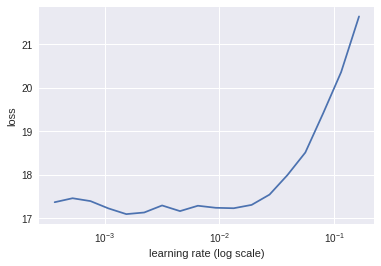

In [0]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=1)

In [0]:
learn.fit(lrs, 1, cycle_len=10, use_clr=(20,10))


epoch      trn_loss   val_loss   
    0      18.932263  49.903625 
    1      20.731924  22.305952 
    2      19.77798   19.35488  
    3      18.349172  19.723294 
    4      17.080861  17.681585 
    5      15.886844  17.582319 
    6      14.831896  16.805934 
    7      13.923792  16.716826 
    8      13.008137  16.177259 
    9      12.183421  16.134823 


[array([16.13482])]

In [0]:
learn.save('fl0')
learn.load('fl0')


In [0]:
learn.freeze_to(-2)
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

epoch      trn_loss   val_loss   
    0      11.247508  16.285592 
    1      11.340057  16.571352 
    2      11.241333  16.546289 
    3      10.958498  16.482356 
    4      10.589913  16.165557 
    5      10.220248  16.327887 
    6      9.85549    16.211017 
    7      9.561611   16.13706  
    8      9.292067   16.11133  
    9      9.04351    16.097462 


[array([16.09746])]

In [0]:
learn.save('drop4')
learn.load('drop4')


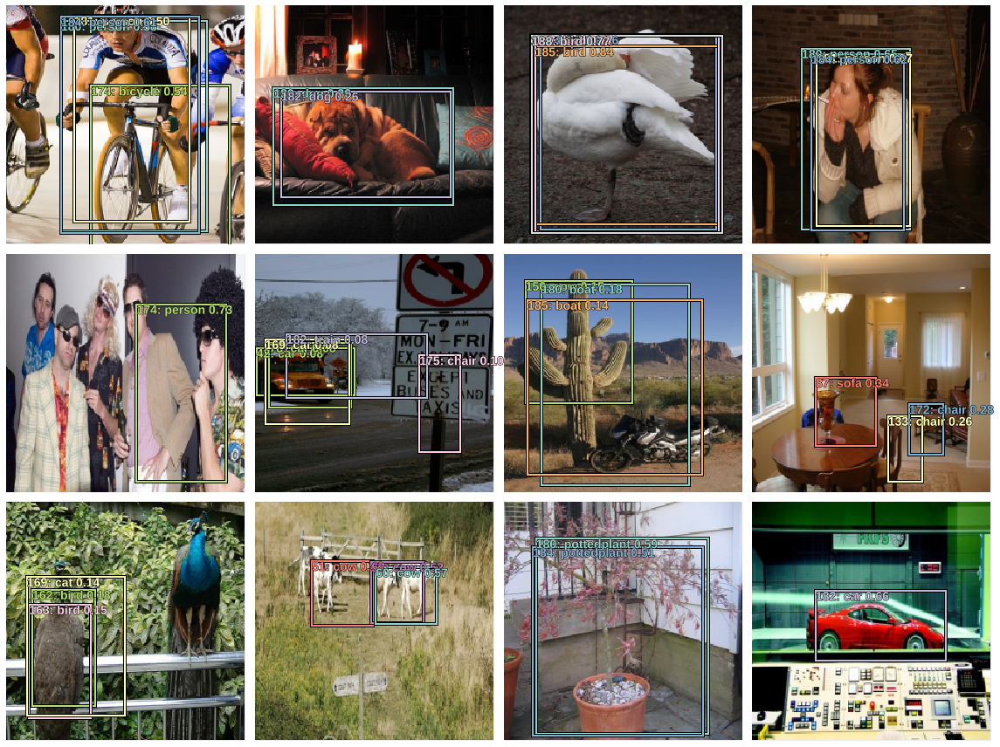

In [0]:
plot_results(0.75)
#This time things are looking quite a bit better. So our last step, for now, is to basically figure out how to pull out just the interesting ones.

## NMS

All we are going to do is we are going to go through every pair of these bounding boxes and if they overlap by more than some amount, say 0.5, using Jaccard and they are both predicting the same class, we are going to assume they are the same thing and we are going to pick the one with higher p value.

It is really boring code, Jeremy didn’t write it himself and copied somebody else’s. No reason particularly to go through it.

In [0]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [0]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [0]:
def show_nmf(idx):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.25
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, 0.4, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
    if not cc:
        print(f"{i}: empty array")
        return
    cc = T(np.concatenate(cc))
    out1 = torch.cat(out1)
    out2 = torch.cat(out2)

    fig, ax = plt.subplots(figsize=(8,8))
    torch_gt(ax, ima, out2, cc, out1, 0.1)

5: empty array
6: empty array
8: empty array


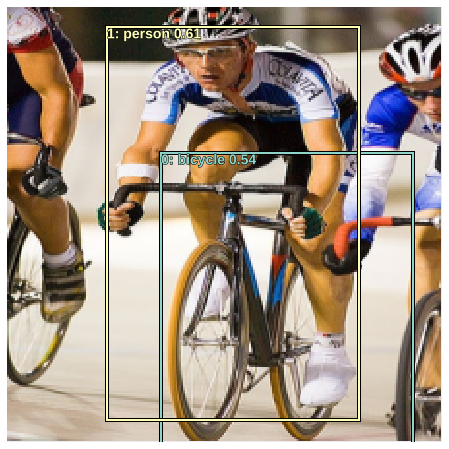

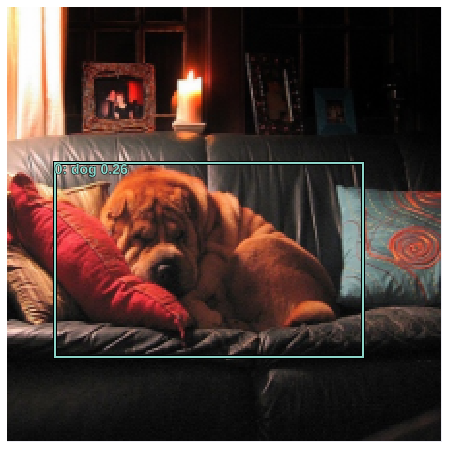

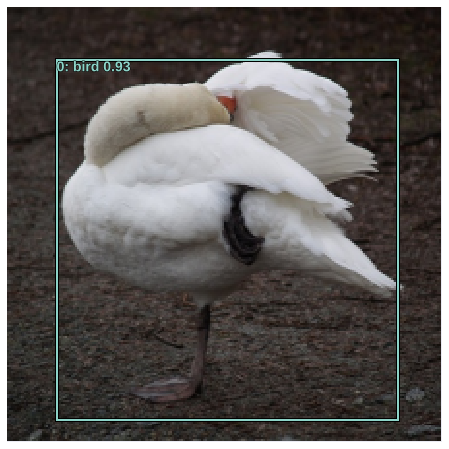

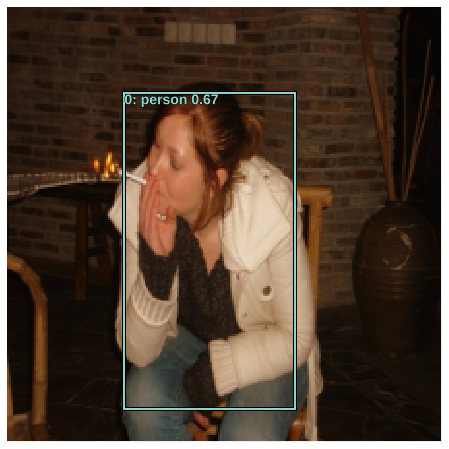

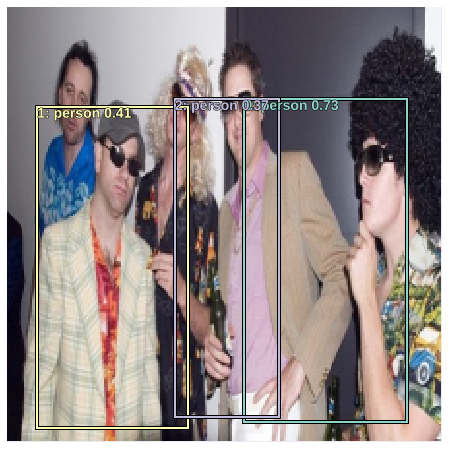

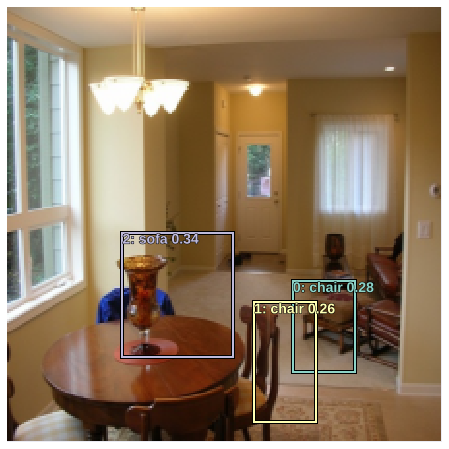

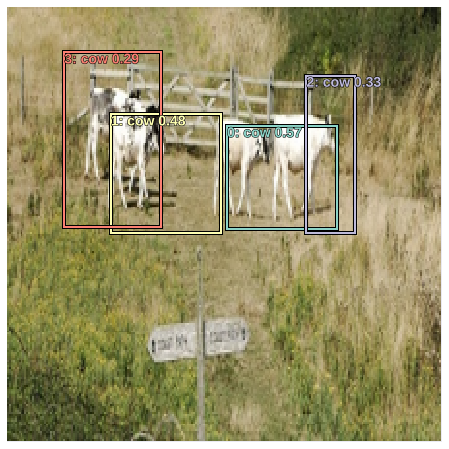

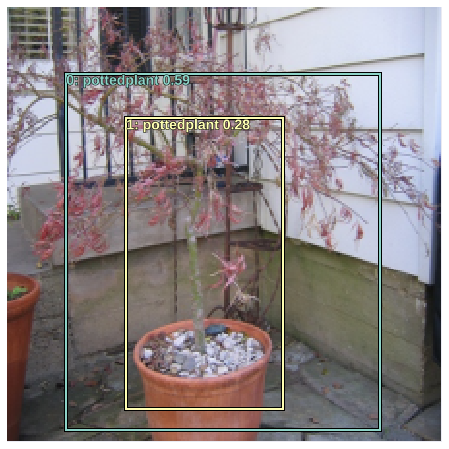

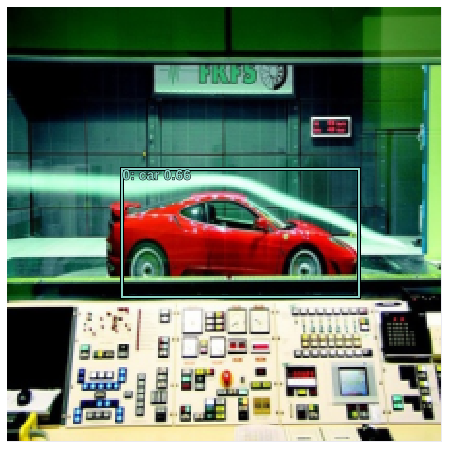

In [0]:
for i in range(12): show_nmf(i)


There are some things still to fix here [1:53:43]. The trick will be to use something called feature pyramid. That is what we are going to do in lesson 14.

## Talking a little more about SSD paper

When this paper came out, Jeremy was excited because this and YOLO were the first kind of single-pass good quality object detection method that come along. There has been this continuous repetition of history in the deep learning world which is things that involve multiple passes of multiple different pieces, over time, particularly where they involve some non-deep learning pieces (like R-CNN did), over time, they always get turned into a single end-to-end deep learning model. So I tend to ignore them until that happens because that’s the point where people have figured out how to show this as a deep learning model, as soon as they do that they generally end up something much faster and much more accurate. So SSD and YOLO were really important.

The model is 4 paragraphs. Papers are really concise which means you need to read them pretty carefully. Partly, though, you need to know which bits to read carefully. The bits where they say “here we are going to prove the error bounds on this model,” you could ignore that because you don’t care about proving error bounds. But the bit which says here is what the model is, you need to read real carefully.

